In [ ]:
from PIL import Image
from google.colab import files
from google.colab import drive
import random
from matplotlib import pyplot as plt
from IPython.display import display
from torch.utils.data import DataLoader, Dataset, ConcatDataset
from torchvision import datasets, transforms
from torchvision.utils import make_grid, save_image
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch import optim
import math, os, pdb, cv2, copy, time
from tqdm.auto import tqdm
import torch.utils.data as data_utils
import torchvision.models as models
from scipy.linalg import sqrtm
import torchvision.utils as vutils
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

# Original dataset

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


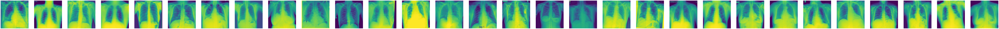

In [ ]:
# Set up paths and image names
drive.mount('/content/drive')
root = "/content/drive/My Drive/COVID-19_Radiography_Dataset/traindata"
path = os.path.join(root, 'COVID')

# Display a sample of images
img_names = []

for folder, subfolders, filenames in os.walk(path):
    for img in filenames:
        img_names.append(folder+'/'+img)

columns = 30
rows = 1
count = columns * rows

randomlist = random.sample(range(0, len(img_names)), count)

plt.figure(figsize=(200,200))
for i, idx in enumerate(randomlist):
    img = Image.open(img_names[idx])
    plt.subplot(rows, columns, i + 1)
    plt.imshow(img)
    plt.axis('off')

# Data pre-processing

In [ ]:
# Function to display tensor images
def show(tensor, title, num=25):
  data = tensor.detach().cpu()
  grid = make_grid(data[:num], nrow=5).permute(1,2,0)
  plt.imshow(grid.clip(0,1))
  plt.title(title)
  plt.show()

In [ ]:
# Image transformation functions
def transform_img(type, img_size):
    if type == "normalize":
        transform = transforms.Compose([
        CLAHEImage(),
        transforms.ToPILImage(),
        transforms.Grayscale(num_output_channels=3),
        transforms.RandomRotation(1),
        transforms.RandomHorizontalFlip(),
        transforms.Resize(img_size),
        transforms.CenterCrop(img_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
      ])
    else:
        transform = transforms.Compose([
        CLAHEImage(),
        transforms.ToPILImage(),
        transforms.Grayscale(num_output_channels=3),
        transforms.RandomRotation(1),
        transforms.RandomHorizontalFlip(),
        transforms.Resize(img_size),
        transforms.CenterCrop(img_size),
        transforms.ToTensor()
      ])
    return transform

# Custom CLAHE (Contrast Limited Adaptive Histogram Equalization) transformation
class CLAHEImage(object):
    def __call__(self, img):
        img = np.array(img).astype(np.uint8)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        clahe = cv2.createCLAHE(clipLimit=4, tileGridSize=(8, 8))
        img_clahe = clahe.apply(gray_img)
        final_img = np.array(img_clahe, dtype=np.float32)
        return final_img

# Custom label transformation
class label_transform(object):
  def __call__(self, label):
    # generate new label
    label = 1
    return label

## Pre-processing COVID real images

In [ ]:
# Set batch size and number of images
batch_size = 128
n_image = 1000

In [ ]:
# Function to get data loader
def get_dataloader(n_image, full_dataset):
  indices = torch.arange(n_image)
  train_data_nk_covid = data_utils.Subset(full_dataset, indices)
  torch.manual_seed(42)
  train_loader_covid = DataLoader(train_data_nk_covid, batch_size=batch_size, shuffle=True)
  real_images, y = next(iter(train_loader_covid))
  return real_images, train_loader_covid, train_data_nk_covid

## 128x128

In [ ]:
# Load and preprocess datasets
root_covid = "/content/drive/My Drive/COVID-19_Radiography_Dataset"

train_data_covid_1 = datasets.ImageFolder(os.path.join(root_covid, 'traindata'), transform=transform_img("normalize", 128), target_transform = label_transform())
train_data_covid_2 = datasets.ImageFolder(os.path.join(root_covid, 'traindata'), transform=transform_img(None, 128), target_transform = label_transform())
full_train_data = train_data_covid_2

# Get data loaders for different datasets
real_images_1, train_loader_covid_1, train_data_covid_1 = get_dataloader(n_image, train_data_covid_1)
real_images_2, train_loader_covid_2, train_data_covid_2 = get_dataloader(n_image, train_data_covid_2)
real_images_3, train_loader_covid_3, train_data_covid_3 = get_dataloader(2000, full_train_data)
real_images_4, train_loader_covid_4, train_data_covid_4 = get_dataloader(3000, full_train_data)

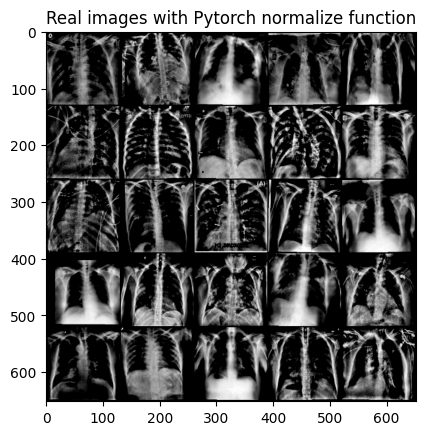

In [ ]:
# Display sample images
show(real_images_1, "Real images with Pytorch normalize function")

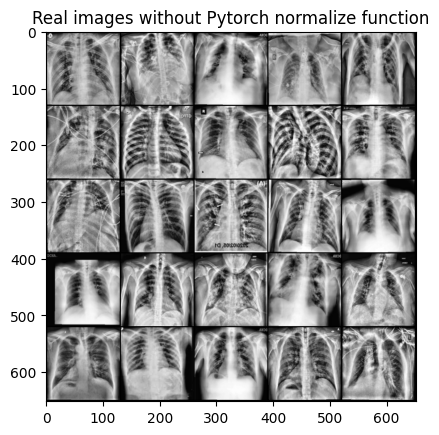

In [ ]:
# Display sample images
show(real_images_2, "Real images without Pytorch normalize function")

## 64x64

In [ ]:
# Load and preprocess 64x64 datasets
train_data_covid_64 = datasets.ImageFolder(os.path.join(root_covid, 'traindata'), transform=transform_img(None, 64), target_transform = label_transform())
real_images_64, train_loader_covid_64, train_data_covid_64 = get_dataloader(n_image, train_data_covid_64)

train_data_covid_64 = datasets.ImageFolder(os.path.join(root_covid, 'traindata'), transform=transform_img(None, 64), target_transform = label_transform())
real_images_64_2000img, train_loader_covid_64_2000img, train_data_covid_64_2000img = get_dataloader(2000, train_data_covid_64)

train_data_covid_64 = datasets.ImageFolder(os.path.join(root_covid, 'traindata'), transform=transform_img(None, 64), target_transform = label_transform())
real_images_64_3000img, train_loader_covid_64_3000img, train_data_covid_64_3000img = get_dataloader(3000, train_data_covid_64)

test_data_covid_64 = data_utils.Subset(train_data_covid_64, torch.arange(616))

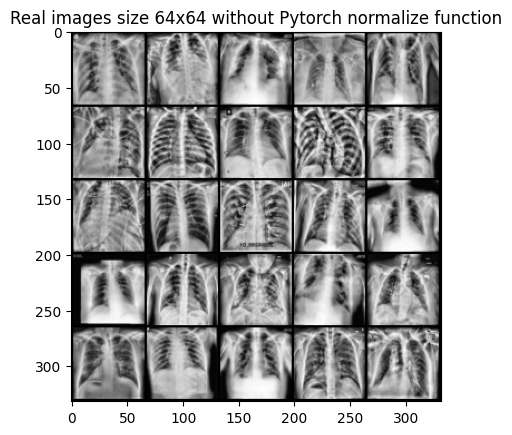

In [ ]:
# Display sample 64x64 images
show(real_images_64, "Real images size 64x64 without Pytorch normalize function")

# GAN models

In [ ]:
# Set hyperparameters for GAN models
batch_size = 128
lr_dc = 0.0002
lr_w = 1e-4
beta1 = 0.5
beta2 = 0.9
z_dim = 100
device = 'cuda' #GPU
root_path = root

In [ ]:
## Save and load checkpoints

def save_checkpoint(name, epoch, gen, gen_opt, crit, crit_opt):
  torch.save({
      'epoch': epoch,
      'model_state_dict': gen.state_dict(),
      'optimizer_state_dict': gen_opt.state_dict()
  }, f"{root_path}G-{name}.pkl")

  torch.save({
      'epoch': epoch,
      'model_state_dict': crit.state_dict(),
      'optimizer_state_dict': crit_opt.state_dict()
  }, f"{root_path}C-{name}.pkl")

  print("Saved checkpoint")

def load_checkpoint(name, gen, gen_opt, crit, crit_opt):
  checkpoint = torch.load(f"{root_path}G-{name}.pkl")
  gen.load_state_dict(checkpoint['model_state_dict'])
  gen_opt.load_state_dict(checkpoint['optimizer_state_dict'])

  checkpoint = torch.load(f"{root_path}C-{name}.pkl")
  crit.load_state_dict(checkpoint['model_state_dict'])
  crit_opt.load_state_dict(checkpoint['optimizer_state_dict'])

  print("Loaded checkpoint")

## WGAN-GP with image size 128x128

In [ ]:
# Functions for noise generation and gradient penalty calculation
def gen_noise(num, z_dim, device='cuda'):
   return torch.randn(num, z_dim, device=device) # 128 x 100

def gen_extra_noise(num, z_dim, noise_factor, device='cuda'):
    return torch.randn(num, z_dim, device=device) + noise_factor * torch.randn(num, z_dim, device=device)

## gradient penalty calculation

def get_gp(real, fake, crit, alpha, gamma=10):
  mix_images = real * alpha + fake * (1-alpha) # 128 x 3 x 128 x 128
  mix_scores = crit(mix_images) # 128 x 1

  gradient = torch.autograd.grad(
      inputs = mix_images,
      outputs = mix_scores,
      grad_outputs=torch.ones_like(mix_scores),
      retain_graph=True,
      create_graph=True,
  )[0] # 128 x 3 x 128 x 128

  gradient = gradient.view(len(gradient), -1)   # 128 x 49152
  gradient_norm = gradient.norm(2, dim=1)
  gp = gamma * ((gradient_norm-1)**2).mean()

  return gp

### The architecture

In [ ]:
# generator model

class Generator(nn.Module):
  def __init__(self, z_dim=64, d_dim=16):
    super(Generator, self).__init__()
    self.z_dim=z_dim

    self.gen = nn.Sequential(
            ## ConvTranspose2d: in_channels, out_channels, kernel_size, stride=1, padding=0
            ## Calculating new width and height: (n-1)*stride -2*padding +ks
            ## n = width or height
            ## ks = kernel size
            ## a 1x1 image with z_dim number of channels (100)
            nn.ConvTranspose2d(z_dim, d_dim * 32, 4, 1, 0), ## 4x4 (ch: 100, 512)
            nn.BatchNorm2d(d_dim*32),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*32, d_dim*16, 4, 2, 1), ## 8x8 (ch: 512, 256)
            nn.BatchNorm2d(d_dim*16),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*16, d_dim*8, 4, 2, 1), ## 16x16 (ch: 256, 128)
            #(n-1)*stride -2*padding +ks = (8-1)*2-2*1+4=16
            nn.BatchNorm2d(d_dim*8),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*8, d_dim*4, 4, 2, 1), ## 32x32 (ch: 128, 64)
            nn.BatchNorm2d(d_dim*4),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*4, d_dim*2, 4, 2, 1), ## 64x64 (ch: 64, 32)
            nn.BatchNorm2d(d_dim*2),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*2, 3, 4, 2, 1), ## 128x128 (ch: 32, 3)
            nn.Tanh() ### produce result in the range from -1 to 1
    )

  def forward(self, noise):
    x=noise.view(len(noise), self.z_dim, 1, 1)  # 128 x 100 x 1 x 1
    return self.gen(x)

## critic model

class Critic(nn.Module):
  def __init__(self, d_dim=16):
    super(Critic, self).__init__()

    self.crit = nn.Sequential(
      # Conv2d: in_channels, out_channels, kernel_size, stride=1, padding=0
      ## New width and height: # (n+2*pad-ks)//stride +1
      nn.Conv2d(3, d_dim, 4, 2, 1), #(n+2*pad-ks)//stride +1 = (128+2*1-4)//2+1=64x64 (ch: 3,16)
      nn.InstanceNorm2d(d_dim),
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim, d_dim*2, 4, 2, 1), ## 32x32 (ch: 16, 32)
      nn.InstanceNorm2d(d_dim*2),
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim*2, d_dim*4, 4, 2, 1), ## 16x16 (ch: 32, 64)
      nn.InstanceNorm2d(d_dim*4),
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim*4, d_dim*8, 4, 2, 1), ## 8x8 (ch: 64, 128)
      nn.InstanceNorm2d(d_dim*8),
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim*8, d_dim*16, 4, 2, 1), ## 4x4 (ch: 128, 256)
      nn.InstanceNorm2d(d_dim*16),
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim*16, 1, 4, 1, 0), #(n+2*pad-ks)//stride +1=(4+2*0-4)//1+1= 1X1 (ch: 256,1)

    )

  def forward(self, image):
    # image: 128 x 3 x 128 x 128
    crit_pred = self.crit(image) # 128 x 1 x 1 x 1
    return crit_pred.view(len(crit_pred),-1) ## 128 x 1


In [ ]:
## Models
gen = Generator(z_dim).to(device)
crit = Critic().to(device)

## Optimizers
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr_w, betas=(beta1, beta2))
crit_opt= torch.optim.Adam(crit.parameters(), lr=lr_w, betas=(beta1, beta2))

In [ ]:
# Print model architectures
print(gen)

Generator(
  (gen): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats

In [ ]:
# Print model architectures
print(crit)

Critic(
  (crit): Sequential(
    (0): Conv2d(3, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): InstanceNorm2d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (8): LeakyReLU(negative_slope=0.2)
    (9): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (11): LeakyReLU(negative_slope=0.2)
    (12): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): InstanceNorm2d(256, eps=1e-05, momentum=0.1, af

### Training

In [ ]:
# Funnction to train WGAN-GP
def train_wgangp(dataset, n_epochs, checkpoint, gen, gen_opt, crit, crit_opt, noise_factor = None):
  cur_step = 0
  show_step = 29
  save_step = 29
  gen_losses = []
  crit_losses = []
  crit_cycles = 5
  for epoch in range(n_epochs):
    for real, _ in tqdm(dataset):
      cur_bs= len(real) #128
      real=real.to(device)
      ### CRITIC
      mean_crit_loss = 0
      for _ in range(crit_cycles):
        crit_opt.zero_grad()

        if noise_factor != None:
          noise = gen_extra_noise(cur_bs, z_dim, noise_factor)
        else:
          noise = gen_noise(cur_bs, z_dim)
        fake = gen(noise)
        crit_fake_pred = crit(fake.detach())
        crit_real_pred = crit(real)

        alpha=torch.rand(len(real),1,1,1,device=device, requires_grad=True) # 128 x 1 x 1 x 1
        gp = get_gp(real, fake.detach(), crit, alpha)

        crit_loss = crit_fake_pred.mean() - crit_real_pred.mean() + gp

        mean_crit_loss+=crit_loss.item() / crit_cycles

        crit_loss.backward(retain_graph=True)
        crit_opt.step()

      crit_losses.append(mean_crit_loss)

      ### GENERATOR
      gen_opt.zero_grad()
      noise = gen_noise(cur_bs, z_dim)

      fake = gen(noise)
      crit_fake_pred = crit(fake)

      gen_loss = -crit_fake_pred.mean()
      gen_loss.backward()
      gen_opt.step()

      gen_losses.append(gen_loss.item())

      if cur_step % save_step == 0 and cur_step > 0:
        print("Saving checkpoint: ", cur_step, save_step)
        save_checkpoint(checkpoint, epoch, gen, gen_opt, crit, crit_opt)

      if (cur_step % show_step == 0 and cur_step > 0):
        show(fake, 'fake')

        gen_mean=sum(gen_losses[-show_step:]) / show_step
        crit_mean = sum(crit_losses[-show_step:]) / show_step
        print(f"Epoch: {epoch}: Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")

        # plt.plot(
        #     range(len(gen_losses)),
        #     torch.Tensor(gen_losses),
        #     label="Generator Loss"
        # )

        # plt.plot(
        #     range(len(gen_losses)),
        #     torch.Tensor(crit_losses),
        #     label="Critic Loss"
        # )

        # plt.ylim(-150,150)
        # plt.legend()
        # plt.show()

      cur_step+=1

# FID score comparision for hyperparameters - using WGAN-GP 128x128 model

In [ ]:
# Function to generate new images
def gen_new_images(n_images, z_dim, gen, gen_noise, title, gen_extra_noise=None, noise_factor=None):
  if gen_extra_noise != None:
    noise = gen_extra_noise(n_images, z_dim, noise_factor=noise_factor)
    print(len(noise))
  else:
    noise = gen_noise(n_images, z_dim)
  fake = gen(noise)
  show(fake, title)
  return fake

In [ ]:
# Functions to compute FID score
def compute_statistics(dataloader, model, device):
    model.eval()
    act_list = []
    with torch.no_grad():
        for real_images, _ in dataloader:
            real_images = F.interpolate(real_images, size=(299, 299), mode='bilinear', align_corners=False)
            real_images = real_images.to(device)
            act = model(real_images)
            act_list.append(act.cpu().numpy())

    act_arr = np.concatenate(act_list, axis=0)
    mu = np.mean(act_arr, axis=0)
    sigma = np.cov(act_arr, rowvar=False)
    return mu, sigma

def calculate_fid(mu1, sigma1, mu2, sigma2):
    ssdiff = np.sum((mu1 - mu2) ** 2.0)
    covmean = sqrtm(sigma1.dot(sigma2))
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid

def printing_fid(real_dataloader, gen_dataloader, model, criteria, device):
    mu_real, sigma_real = compute_statistics(real_dataloader, model, device)
    mu_gen, sigma_gen = compute_statistics(gen_dataloader, model, device)
    fid_value = calculate_fid(mu_real, sigma_real, mu_gen, sigma_gen)
    print('FID Score of', criteria, "is:", fid_value)

# Function to load fake dataset to DataLoader for classification task
def creating_gen_loader(fake):
    fake_imgs = fake.detach().cpu()
    label = np.ones((len(fake_imgs),), dtype=int) # another list of numpy arrays (targets)
    fake_dataset = []
    for i in range(len(fake)):
        fake_dataset.append([fake_imgs[i], label[i]])
    gen_loader = DataLoader(fake_dataset, shuffle=True, batch_size=batch_size)
    generated_images, y = next(iter(gen_loader))
    return fake_dataset, gen_loader

In [ ]:
# Loading InceptionV3 model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_iv3 = models.inception_v3(pretrained=True).to(device)
model_iv3 = model_iv3.eval()  # Set the model to evaluation mode

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## Hyperparameters comparison between normalize and not normalize

### Run training

In [ ]:
load_checkpoint("resettraining", gen, gen_opt, crit, crit_opt)
# Training GAN with normalize images
train_wgangp(train_loader_covid_1, 50, "normalize50epoch100nz1000data0noise[1]", gen, gen_opt, crit, crit_opt)

In [ ]:
# Training GAN without normalize images
train_wgangp(train_loader_covid_2, 50, "50epoch100nz1000data0noise[2]", gen, gen_opt, crit, crit_opt)

### FID scores

Loaded checkpoint


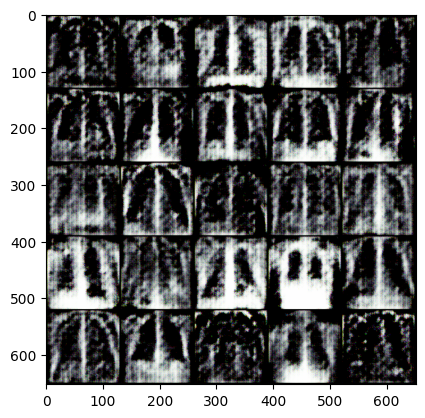

FID Score of normalize data is: 1336.228889931883


In [ ]:
# with normalize images
load_checkpoint("normalize50epoch100nz1000data0noise[1]", gen, gen_opt, crit, crit_opt)
fake_1 = gen_new_images(1000, z_dim, gen, gen_noise, "Generated images with Pytorch normalize function")
generated_dataset_1, gen_loader_1 = creating_gen_loader(fake_1)
printing_fid(train_loader_covid_1, gen_loader_1, model_iv3, "normalize data", device)

Loaded checkpoint


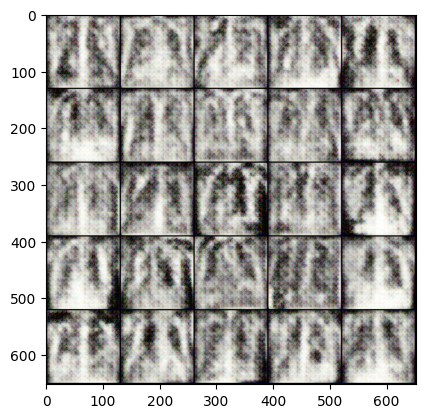

FID Score of not normalize data is: 960.5954402185182


In [ ]:
# without normalize images
load_checkpoint("50epoch100nz1000data0noise[2]", gen, gen_opt, crit, crit_opt)
fake_2 = gen_new_images(1000, z_dim, gen, gen_noise, "Generated images without Pytorch normalize function")
generated_dataset_2, gen_loader_2 = creating_gen_loader(fake_2)
printing_fid(train_loader_covid_2, gen_loader_2, model_iv3, "not normalize data", device)

## Hyperparameters comparison between dataset size

### Run training

In [ ]:
load_checkpoint("resettraining", gen, gen_opt, crit, crit_opt)
# Training GAN with 2000 images
train_wgangp(train_loader_covid_3, 50, "50epoch100nz2000data0noise[3]", gen, gen_opt, crit, crit_opt)

In [ ]:
load_checkpoint("resettraining", gen, gen_opt, crit, crit_opt)
# Training GAN with 3000 images
train_wgangp(train_loader_covid_4, 50, "50epoch100nz3000data0noise[4]", gen, gen_opt, crit, crit_opt)

### FID scores

Loaded checkpoint


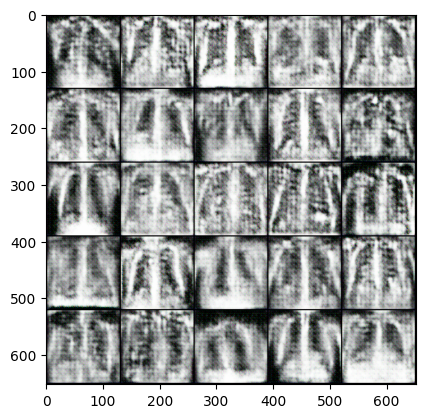

FID Score of 2000 images is: 949.6031258501916


In [ ]:
# with 2000 images
load_checkpoint("50epoch100nz2000data0noise[3]", gen, gen_opt, crit, crit_opt)
fake_3 = gen_new_images(1000, z_dim, gen, gen_noise, "Generated images from WGAN-GP trained with 2000 images")
generated_dataset_3, gen_loader_3 = creating_gen_loader(fake_3)
printing_fid(train_loader_covid_4, gen_loader_3, model_iv3, "2000 images", device)

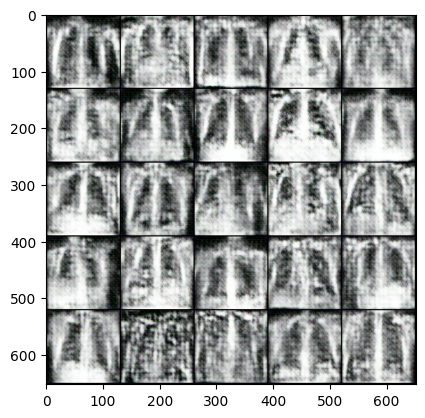

FID Score of 3000 images is: 941.2843638385594


In [ ]:
# with 3000 images
load_checkpoint("50epoch100nz3000data0noise[4]", gen, gen_opt, crit, crit_opt)
fake_4 = gen_new_images(1000, z_dim, gen, gen_noise, "Generated images from WGAN-GP trained with 3000 images")
generated_dataset_4, gen_loader_4 = creating_gen_loader(fake_4)
printing_fid(train_loader_covid_4, gen_loader_4, model_iv3, "3000 images", device)

## Between noise factors

### Run training

In [ ]:
load_checkpoint("resettraining", gen, gen_opt, crit, crit_opt)

Loaded checkpoint


In [ ]:
noise_factors = [0.01, 0.1, 0.5, 1.0]
checkpoints = ['50epoch100nz1000data001noise[5]', '50epoch100nz1000data01noise[6]', '50epoch100nz1000data05noise[7]', '50epoch100nz1000data1noise[8]']

In [ ]:
for noise, checkpoint in zip(noise_factors, checkpoints):
    train_wgangp(train_loader_covid_2, 50, checkpoint, gen, gen_opt, crit, crit_opt, noise)
    load_checkpoint("resettraining", gen, gen_opt, crit, crit_opt)

### FID scores

Loaded checkpoint


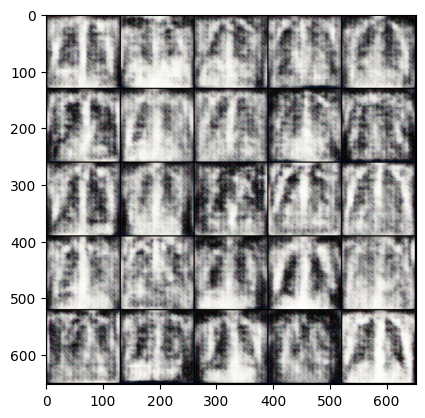

FID Score of noise factor 0.01 is: 1013.995787511064


In [ ]:
load_checkpoint("50epoch100nz1000data001noise[5]", gen, gen_opt, crit, crit_opt)
fake_5 = gen_new_images(1000, z_dim, gen, gen_noise, "Generated images from WGAN-GP trained with noise factor 0.01", gen_extra_noise, noise_factor=0.01)
generated_dataset_5, gen_loader_5 = creating_gen_loader(fake_5)
printing_fid(train_loader_covid_2, gen_loader_5, model_iv3, "noise factor 0.01", device)

Loaded checkpoint


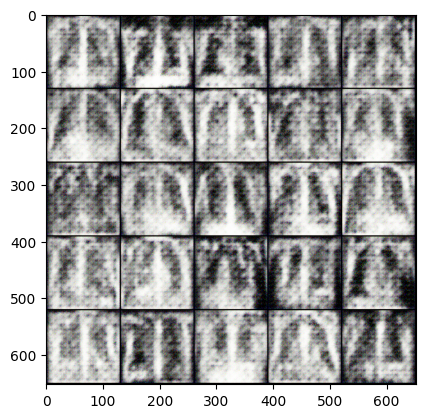

FID Score of noise factor 0.1 is: 1242.6544172153644


In [ ]:
load_checkpoint("50epoch100nz1000data01noise[6]", gen, gen_opt, crit, crit_opt)
fake_6 = gen_new_images(1000, z_dim, gen, gen_noise, "Generated images from WGAN-GP trained with noise factor 0.1", gen_extra_noise, noise_factor=0.1)
generated_dataset_6, gen_loader_6 = creating_gen_loader(fake_6)
printing_fid(train_loader_covid_2, gen_loader_6, model_iv3, "noise factor 0.1", device)

Loaded checkpoint


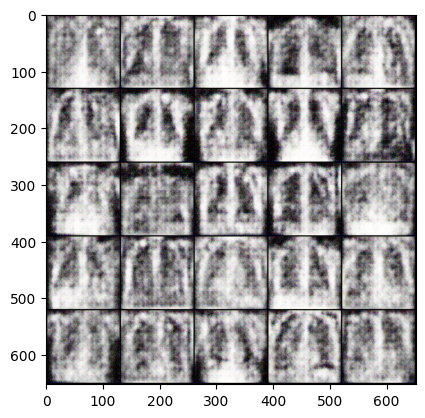

FID Score of noise factor 0.5 is: 1181.5839553708522


In [ ]:
load_checkpoint("50epoch100nz1000data05noise[7]", gen, gen_opt, crit, crit_opt)
fake_7 = gen_new_images(1000, z_dim, gen, gen_noise, "Generated images from WGAN-GP trained with noise factor 0.5", gen_extra_noise, noise_factor=0.5)
generated_dataset_7, gen_loader_7 = creating_gen_loader(fake_7)
printing_fid(train_loader_covid_2, gen_loader_7, model_iv3, "noise factor 0.5", device)

Loaded checkpoint


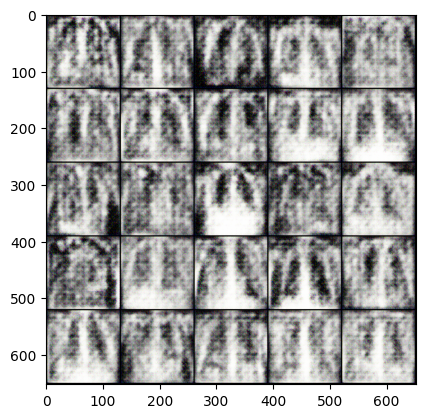

FID Score of noise factor 1  is: 1121.5108287543308


In [ ]:
load_checkpoint("50epoch100nz1000data1noise[8]", gen, gen_opt, crit, crit_opt)
fake_8 = gen_new_images(1000, z_dim, gen, gen_noise, "Generated images from WGAN-GP trained with noise factor 1", gen_extra_noise, noise_factor=1.0)
generated_dataset_8, gen_loader_8 = creating_gen_loader(fake_8)
printing_fid(train_loader_covid_2, gen_loader_8, model_iv3, "noise factor 1", device)

## Between different number of epochs

### Run training

In [ ]:
load_checkpoint("resettraining", gen, gen_opt, crit, crit_opt)

Loaded checkpoint


In [ ]:
train_wgangp(train_loader_covid_2, 100, "100epoch100nz1000data0noise[2]", gen, gen_opt, crit, crit_opt)

In [ ]:
train_wgangp(train_loader_covid_2, 200, "300epoch100nz1000data0noise[2]", gen, gen_opt, crit, crit_opt)

In [ ]:
train_wgangp(train_loader_covid_2, 200, "500epoch100nz1000data0noise[2]", gen, gen_opt, crit, crit_opt)

In [ ]:
train_wgangp(train_loader_covid_2, 200, "700epoch100nz1000data0noise[2]", gen, gen_opt, crit, crit_opt)

### FID scores

Loaded checkpoint


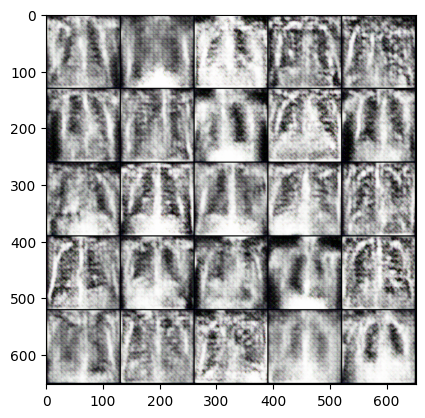

1000
FID Score of 100 epochs  is: 1062.3671810368867


In [ ]:
#100 epochs
load_checkpoint("100epoch100nz1000data0noise[2]", gen, gen_opt, crit, crit_opt)
fake_100ep = gen_new_images(1000, z_dim, gen, gen_noise, "Generated images from WGAN-GP trained after 100 epochs")
generated_dataset_100ep, gen_loader_100ep = creating_gen_loader(fake_100ep)
printing_fid(train_loader_covid_2, gen_loader_100ep, model_iv3, "100 epochs ", device)

Loaded checkpoint


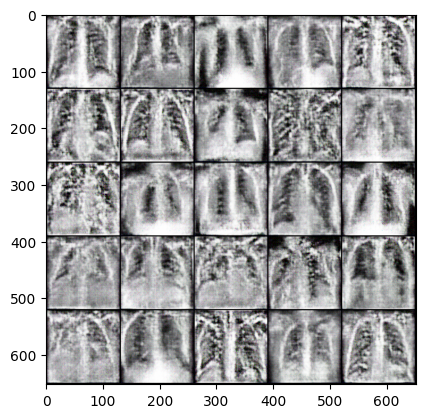

FID Score of 300 epochs is: 666.437904548267


In [ ]:
#300 epochs
load_checkpoint("300epoch100nz1000data0noise[2]", gen, gen_opt, crit, crit_opt)
fake_300ep = gen_new_images(1000, z_dim, gen, gen_noise, "Generated images from WGAN-GP trained after 300 epochs")
generated_dataset_300ep, gen_loader_300ep = creating_gen_loader(fake_300ep)
printing_fid(train_loader_covid_2, gen_loader_300ep, model_iv3, "300 epochs", device)

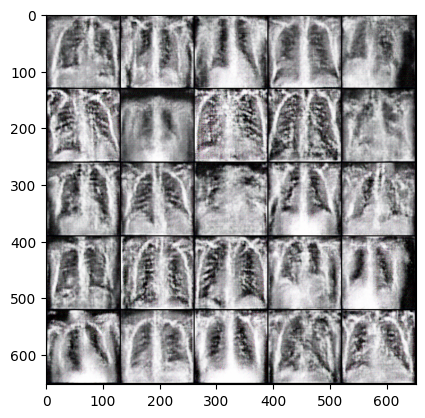

FID Score of 500 epochs is: 612.7387941302784


In [ ]:
#500 epochs
load_checkpoint("500epoch100nz1000data0noise[2]", gen, gen_opt, crit, crit_opt)
fake_500ep = gen_new_images(1000, z_dim, gen, gen_noise, "Generated images from WGAN-GP trained after 500 epochs")
generated_dataset_500ep, gen_loader_500ep = creating_gen_loader(fake_500ep)
printing_fid(train_loader_covid_2, gen_loader_500ep, model_iv3, "500 epochs", device)

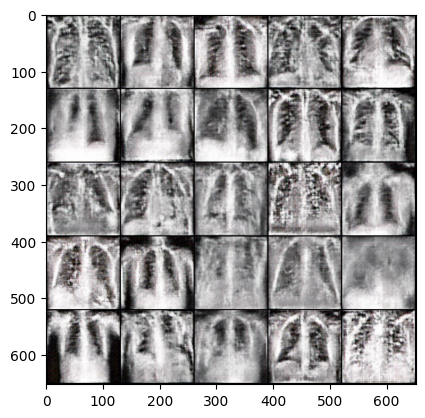

FID Score of 700 epochs is: 619.0215371009069


In [ ]:
#700 epochs
load_checkpoint("700epoch100nz1000data0noise[2]", gen, gen_opt, crit, crit_opt)
fake_700ep = gen_new_images(1000, z_dim, gen, gen_noise, "Generated images from WGAN-GP trained after 700 epochs")
generated_dataset_700ep, gen_loader_700ep = creating_gen_loader(fake_700ep)
printing_fid(train_loader_covid_2, gen_loader_700ep, model_iv3, "700 epochs", device)

# DCGAN with image size 64x64

In [ ]:
# Hyperparameters setting up
image_size = 64
ngf = 64 # Size of feature maps in generator
ndf = 64 # Size of feature maps in discriminator
lr_dc = 0.0002
beta1 = 0.5
ngpu = 1
fixed_noise = torch.randn(1000, z_dim, 1, 1, device=device)
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## The architecture

In [ ]:
# Generator Code

class DCGenerator(nn.Module):
    def __init__(self, ngpu):
        super(DCGenerator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(z_dim, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)


class DCDiscriminator(nn.Module):
    def __init__(self, ngpu):
        super(DCDiscriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(3, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Create the generator
netG = DCGenerator(ngpu).to(device)
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))
netG.apply(weights_init)

# Create the Discriminator
netD = DCDiscriminator(ngpu).to(device)
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
netD.apply(weights_init)

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr_dc, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr_dc, betas=(beta1, 0.999))
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(1000, z_dim, 1, 1, device=device)
# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

In [ ]:
print(netG)

DCGenerator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )


In [ ]:
print(netD)

DCDiscriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


## Training

In [ ]:
# Training Loop

def train_dcgan(dataset, n_epochs, checkpoint):
    # Lists to keep track of progress
    img_list = []
    G_losses = []
    D_losses = []
    iters = 0

    # For each epoch
    for epoch in range(n_epochs):
        # For each batch in the dataloader
        for i, data in enumerate(dataset, 0):

            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            ## Train with all-real batch
            netD.zero_grad()
            # Format batch
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            # Forward pass real batch through D
            output = netD(real_cpu).view(-1)
            # Calculate loss on all-real batch
            errD_real = criterion(output, label)
            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()

            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, z_dim, 1, 1, device=device)
            # Generate fake image batch with G
            fake = netG(noise)
            label.fill_(fake_label)
            # Classify all fake batch with D
            output = netD(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = criterion(output, label)
            # Calculate the gradients for this batch, accumulated (summed) with previous gradients
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            # Compute error of D as sum over the fake and the real batches
            errD = errD_real + errD_fake
            # Update D
            optimizerD.step()

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            netG.zero_grad()
            label.fill_(real_label)  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = netD(fake).view(-1)
            # Calculate G's loss based on this output
            errG = criterion(output, label)
            # Calculate gradients for G
            errG.backward()
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG.step()

            # Output training stats
            if i % 50 == 0:
                print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                      % (epoch, n_epochs, i, len(dataset),
                        errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())

            # Check how the generator is doing by saving G's output on fixed_noise
            if (iters % 500 == 0) or ((epoch == n_epochs-1) and (i == len(dataset)-1)):
                with torch.no_grad():
                    fake = netG(fixed_noise).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            iters += 1

        save_checkpoint(checkpoint, epoch, netG, optimizerG, netD, optimizerD)

In [ ]:
# Training DCGAN with 50 epochs
train_dcgan(train_loader_covid_64, 50, "DC50epoch100nz1000data0noise[2]")

In [ ]:
# Training DCGAN with 500 epochs
train_dcgan(train_loader_covid_64_2000img, 500, "DC500epoch100nz2000data0noise*")

## Generating new images

Loaded checkpoint


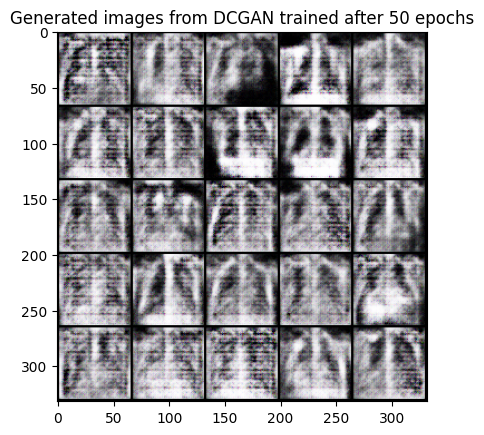

FID Score of DCGAN is: 773.7814977045


In [ ]:
#50 epochs
load_checkpoint("DC50epoch100nz1000data0noise[2]", netG, optimizerG, netD, optimizerD)
noise = torch.randn(1000, z_dim, 1, 1, device=device)
with torch.no_grad():
    fake_9 = netG(noise).detach().cpu()
show(fake_9, "Generated images from DCGAN trained after 50 epochs")
generated_dataset_9, gen_loader_9 = creating_gen_loader(fake_9)
printing_fid(train_loader_covid_64, gen_loader_9, model_iv3, "DCGAN", device)

Loaded checkpoint


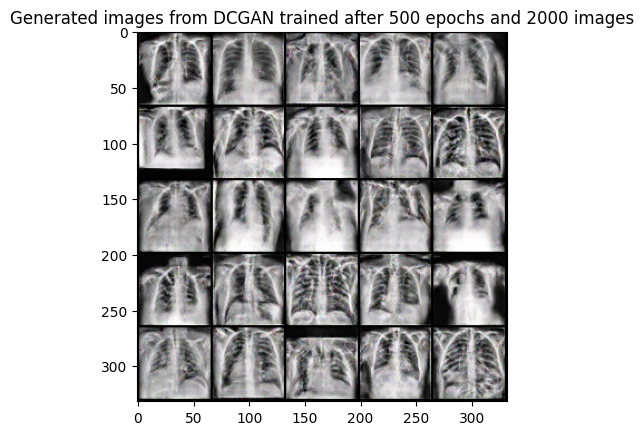

FID Score of DCGAN is: 147.86136818908267


In [ ]:
#500 epochs + 2000 images
load_checkpoint("DC500epoch100nz2000data0noise*", netG, optimizerG, netD, optimizerD)
noise = torch.randn(2000, z_dim, 1, 1, device=device)
with torch.no_grad():
    fake_dcgan_2kimg = netG(noise).detach().cpu()
show(fake_dcgan_2kimg, "Generated images from DCGAN trained after 500 epochs and 2000 images")
generated_dataset_dcgan_2kimg, gen_loader_dcgan_2kimg = creating_gen_loader(fake_dcgan_2kimg)
printing_fid(train_loader_covid_64, gen_loader_dcgan_2kimg, model_iv3, "DCGAN", device)

In [ ]:
noise = torch.randn(500, z_dim, 1, 1, device=device)
with torch.no_grad():
    fake_dcgan_500img = netG(noise).detach().cpu()
generated_dataset_dcgan_500img, gen_loader_dcgan_500img = creating_gen_loader(fake_dcgan_500img)

# WGAN-GP with image size 64x64

## The architecture

In [ ]:
# generator model
class Generator64(nn.Module):
    def __init__(self, z_dim=64, d_dim=16):
        super(Generator64, self).__init__()
        self.z_dim = z_dim

        self.gen = nn.Sequential(
            # Start from a size of 4x4
            nn.ConvTranspose2d(z_dim, d_dim * 32, 4, 1, 0, bias=False),
            nn.BatchNorm2d(d_dim * 32),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim * 32, d_dim * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(d_dim * 16),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim * 16, d_dim * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(d_dim * 8),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim * 8, d_dim * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(d_dim * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim * 4, 3, 4, 2, 1, bias=False),
            nn.Tanh()  # Final size: 64x64
        )

    def forward(self, noise):
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

# critic model
class Critic64(nn.Module):
    def __init__(self, d_dim=64):
        super(Critic64, self).__init__()

        self.crit = nn.Sequential(
            nn.Conv2d(3, d_dim, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(d_dim),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(d_dim, d_dim * 2, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(d_dim * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(d_dim * 2, d_dim * 4, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(d_dim * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(d_dim * 4, d_dim * 8, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(d_dim * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(d_dim * 8, 1, 4, 1, 0, bias=False)  # Final size: 1x1
        )

    def forward(self, image):
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

In [ ]:
## Models
gen64 = Generator64(z_dim).to(device)
crit64 = Critic64().to(device)

## Optimizers
gen_opt64 = torch.optim.Adam(gen64.parameters(), lr=lr_w, betas=(beta1, beta2))
crit_opt64 = torch.optim.Adam(crit64.parameters(), lr=lr_w, betas=(beta1, beta2))

In [ ]:
print(gen64)

Generator64(
  (gen): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [ ]:
print(crit64)

Critic64(
  (crit): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(512, 1

## Training

In [ ]:
load_checkpoint("resettraining", gen, gen_opt, crit, crit_opt)

Loaded checkpoint


In [ ]:
train_wgangp(train_loader_covid_64, 50, "W6450epoch100nz1000data0noise[2]", gen64, gen_opt64, crit64, crit_opt64)

In [ ]:
train_wgangp(train_loader_covid_64_2000img, 500, "W64500epoch100nz2000data0noise***", gen64, gen_opt64, crit64, crit_opt64)

## Generating new images

In [ ]:
load_checkpoint("W6450epoch100nz1000data0noise[2]", gen64, gen_opt64, crit64, crit_opt64)
fake_10 = gen_new_images(1000, z_dim, gen64, gen_noise, "Generated images from WGAN-GP trained after 50 epochs")
generated_dataset_10, gen_loader_10 = creating_gen_loader(fake_10)
printing_fid(train_loader_covid_64, gen_loader_10, model_iv3, "WGAN-GP 64x64", device)

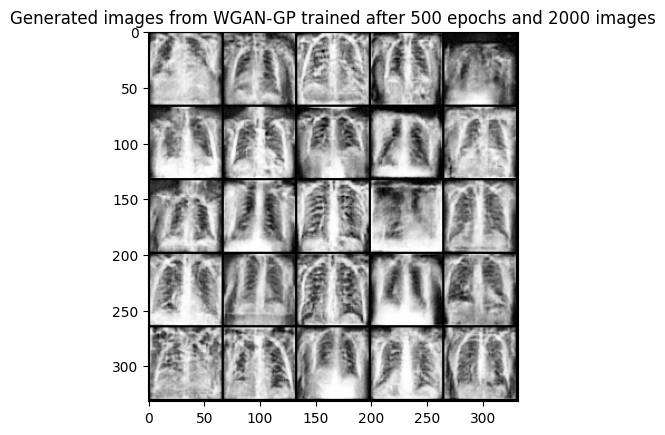

FID Score of WGAN-GP 64x64 for 2000 images is: 110.22088828203283


In [ ]:
load_checkpoint("W64500epoch100nz2000data0noise***", gen64, gen_opt64, crit64, crit_opt64)
fake_w64_2kimg = gen_new_images(2000, z_dim, gen64, gen_noise, "Generated images from WGAN-GP trained after 500 epochs and 2000 images")
generated_dataset_w64_2kimg, gen_loader_w64_2kimg = creating_gen_loader(fake_w64_2kimg)
printing_fid(train_loader_covid_64, gen_loader_w64_2kimg, model_iv3, "WGAN-GP 64x64 for 2000 images", device)

Loaded checkpoint


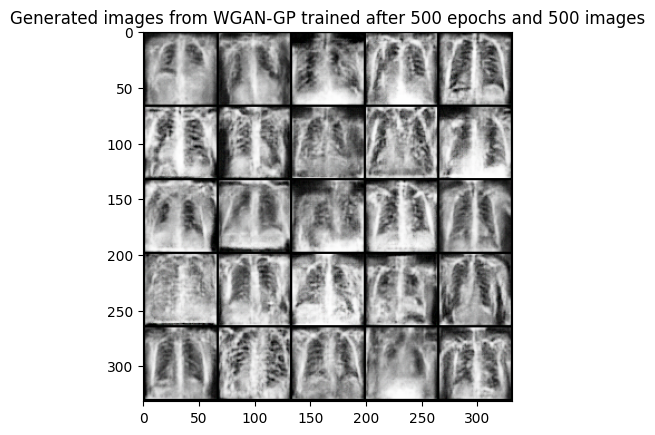

In [ ]:
load_checkpoint("W64500epoch100nz2000data0noise***", gen64, gen_opt64, crit64, crit_opt64)
fake_w64_500img = gen_new_images(500, z_dim, gen64, gen_noise, "500 generated images from WGAN-GP trained after 500 epochs")
generated_dataset_w64_500img, gen_loader_w64_500img = creating_gen_loader(fake_w64_500img)

# COVID-19 classification

In [ ]:
def combine_normal_and_covid_dataset(covid_fake_dataset, covid_real_dataset, normal_real_dataset):
  dataset = ConcatDataset([covid_fake_dataset, covid_real_dataset, normal_real_dataset])
  print("Length of the combined dataset is:", len(dataset))
  train_size = int(0.8 * len(dataset))
  val_size = len(dataset) - train_size
  train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])
  torch.manual_seed(42)
  train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
  val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
  loaders = {'train':train_loader, 'val':val_loader}
  dataset_sizes = {'train':train_size, 'val':val_size}
  return loaders, dataset_sizes

In [ ]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds)), preds

def train_densenet(model, criterion, optimizer, scheduler, epochs, loaders, dataset_sizes):
  since = time.time()
  best_model = copy.deepcopy(model.state_dict())
  best_acc = 0.0
  for epoch in range(epochs):
    for phase in ['train', 'val']:
      if phase == 'train':
        model.train()
      else:
        model.eval()

      running_loss = 0.0
      running_corrects = 0.0

      for inputs, labels in loaders[phase]:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()

        with torch.set_grad_enabled(phase=='train'):
          outp = model(inputs)
          _, pred = torch.max(outp, 1)
          loss = criterion(outp, labels)

          if phase == 'train':
            loss.backward()
            optimizer.step()

        running_loss += loss.item()*inputs.size(0)
        running_corrects += torch.sum(pred == labels.data)


      epoch_loss = running_loss / dataset_sizes[phase]
      epoch_acc = running_corrects.double()/dataset_sizes[phase]
      losses[phase].append(epoch_loss)
      accuracies[phase].append(epoch_acc)
      if phase == 'train':
        print('Epoch: {}/{}'.format(epoch+1, epochs))
      print('{} - loss:{}, accuracy{}'.format(phase, epoch_loss, epoch_acc))

      if phase == 'val':
        print('Time: {}m {}s'.format((time.time()- since)//60, (time.time()- since)%60))

      if phase == 'val' and epoch_acc > best_acc:
        best_acc = epoch_acc
        best_model = copy.deepcopy(model.state_dict())
    scheduler.step()
  time_elapsed = time.time() - since
  print('Training Time {}m {}s'.format(time_elapsed//60, time_elapsed%60))
  print('Best accuracy {}'.format(best_acc))

  model.load_state_dict(best_model)
  return model

def load_checkpoint_resnet(filepath):
    checkpoint = torch.load(filepath)
    model = checkpoint['model']
    model.load_state_dict(checkpoint['state_dict'])
    for parameter in model.parameters():
        parameter.requires_grad = False

    model.eval()
    return model

In [ ]:
def validation_step(batch):
        images,labels = batch
        images,labels = images.to(device),labels.to(device)
        out = model(images)
        loss = F.cross_entropy(out, labels)
        acc,preds = accuracy(out, labels)

        return {'val_loss': loss.detach(), 'val_acc':acc.detach(),
                'preds':preds.detach(), 'labels':labels.detach()}

def test_prediction(outputs):
      batch_losses = [x['val_loss'] for x in outputs]
      epoch_loss = torch.stack(batch_losses).mean()
      batch_accs = [x['val_acc'] for x in outputs]
      epoch_acc = torch.stack(batch_accs).mean()
      # combine predictions
      batch_preds = [pred for x in outputs for pred in x['preds'].tolist()]
      # combine labels
      batch_labels = [lab for x in outputs for lab in x['labels'].tolist()]

      return {'test_loss': epoch_loss.item(), 'test_acc': epoch_acc.item(),
              'test_preds': batch_preds, 'test_labels': batch_labels}

@torch.no_grad()
def test_predict(model, test_loader):
    model.eval()
    # perform testing for each batch
    outputs = [validation_step(batch) for batch in test_loader]
    results = test_prediction(outputs)
    print('test_loss: {:.4f}, test_acc: {:.4f}'
          .format(results['test_loss'], results['test_acc']))

    return results['test_preds'], results['test_labels']

def plotting_confusion_matrix(cm):
  plt.figure()
  plot_confusion_matrix(cm, figsize=(6,4),cmap=plt.cm.Blues)
  plt.xticks(range(2), ['Normal', 'COVID-19'], fontsize=16)
  plt.yticks(range(2), ['Normal', 'COVID19'], fontsize=16)
  plt.xlabel('Predicted Label',fontsize=18)
  plt.ylabel('True Label',fontsize=18)
  plt.show()

def compute_performance_metrics(cm, preds, labels):
  tn, fp, fn, tp = cm.ravel()
  accuracy = (np.array(preds) == np.array(labels)).sum() / len(preds)
  precision = tp/(tp+fp)
  recall = tp/(tp+fn)
  f1 = 2*((precision*recall)/(precision+recall))
  print("Accuracy of the model is {:.4f}".format(accuracy))
  print("Recall of the model is {:.4f}".format(recall))
  print("Precision of the model is {:.4f}".format(precision))
  print("F1 Score of the model is {:.4f}".format(f1))

## Loading normal chest X-ray dataset

In [ ]:
root_normal = "/content/drive/My Drive/COVID-19_Radiography_Dataset"
train_data_normal = datasets.ImageFolder(os.path.join(root_covid, 'traindatanormal'), transform=transform_img(None, 64))
indices_normal = torch.arange(5000)
traindata_normal_5k = data_utils.Subset(train_data_normal, indices_normal)
testdata_normal_1k = data_utils.Subset(train_data_normal, torch.arange(1000))
train_loader_normal = DataLoader(traindata_normal_5k, batch_size=batch_size, shuffle=True)

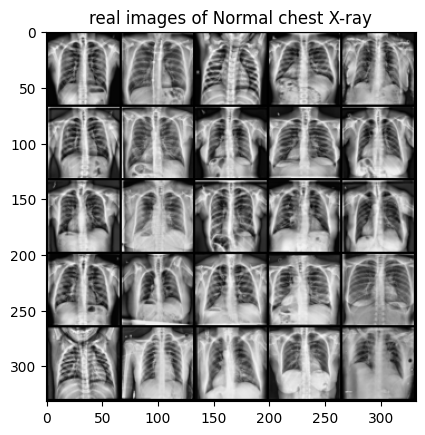

In [ ]:
x, y = next(iter(train_loader_normal))
show(x, "real images of Normal chest X-ray")

## Accuracy scores

### Using generated images from DCGAN

In [ ]:
loaders, dataset_sizes = combine_normal_and_covid_dataset(generated_dataset_dcgan_2kimg, train_data_covid_64_3000img, traindata_normal_5k)

Length of the combined dataset is: 10000


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

model = torchvision.models.densenet161(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

in_features = model.classifier.in_features

model.classifier = nn.Linear(in_features, 2)
#save the losses for further visualization
losses = {'train':[], 'val':[]}
accuracies = {'train':[], 'val':[]}

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet161_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet161_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.classifier.parameters(), lr = 0.001)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 4, gamma=0.1)

In [ ]:
model = model.to(device)
epochs = 10
model = train_densenet(model, criterion, optimizer, scheduler, epochs, loaders, dataset_sizes)

Epoch: 1/10
train - loss:0.4428592739105225, accuracy0.79425
val - loss:0.4057898879051208, accuracy0.8250000000000001
Time: 0.0m 46.116307973861694s
Epoch: 2/10
train - loss:0.334224086523056, accuracy0.857375
val - loss:0.3306587405204773, accuracy0.855
Time: 1.0m 29.481656551361084s
Epoch: 3/10
train - loss:0.30952781343460084, accuracy0.868125
val - loss:0.30465885043144225, accuracy0.8715
Time: 2.0m 13.311323165893555s
Epoch: 4/10
train - loss:0.3019040801525116, accuracy0.87175
val - loss:0.30792317843437195, accuracy0.8595
Time: 2.0m 55.23008418083191s
Epoch: 5/10
train - loss:0.2853828792572021, accuracy0.878125
val - loss:0.30296986317634583, accuracy0.865
Time: 3.0m 37.56372904777527s
Epoch: 6/10
train - loss:0.27910079050064085, accuracy0.884625
val - loss:0.290610759973526, accuracy0.8785000000000001
Time: 4.0m 19.33840560913086s
Epoch: 7/10
train - loss:0.2775396776199341, accuracy0.885375
val - loss:0.28577969217300414, accuracy0.879
Time: 5.0m 3.7699148654937744s
Epoch: 

In [ ]:
# It is a good practice to retrain the rest of the network after we have trained the last layer. In most cases, this leads to an increase in performance.

for param in model.parameters():
    param.requires_grad = True

optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001)

model.to(device)
grad_clip = None

epochs = 10
model = train_densenet(model, criterion, optimizer, scheduler, epochs, loaders, dataset_sizes)

Epoch: 1/10
train - loss:0.17442815083265303, accuracy0.935625
val - loss:0.1105412826538086, accuracy0.9530000000000001
Time: 0.0m 46.95603108406067s
Epoch: 2/10
train - loss:0.05079758454859257, accuracy0.982875
val - loss:0.07946858388185501, accuracy0.968
Time: 1.0m 32.569849491119385s
Epoch: 3/10
train - loss:0.024700026880949737, accuracy0.992125
val - loss:0.07297056484222413, accuracy0.9725
Time: 2.0m 38.666436433792114s
Epoch: 4/10
train - loss:0.023738752160221338, accuracy0.992
val - loss:0.06981154823303223, accuracy0.975
Time: 3.0m 26.879804611206055s
Epoch: 5/10
train - loss:0.01677906081825495, accuracy0.994375
val - loss:0.0720187748670578, accuracy0.971
Time: 4.0m 19.070736408233643s
Epoch: 6/10
train - loss:0.017171462953090667, accuracy0.99425
val - loss:0.09895160448551178, accuracy0.9645
Time: 5.0m 14.79855227470398s
Epoch: 7/10
train - loss:0.01122948044911027, accuracy0.9958750000000001
val - loss:0.066911465883255, accuracy0.9715
Time: 6.0m 9.120809555053711s
Ep

In [ ]:
# Save Model
bestmodel = {'state_dict': model.state_dict(),
              'optimizer' : optimizer.state_dict()}

torch.save(bestmodel, 'COVIDDenseNet.pth')

In [ ]:
model = load_checkpoint_resnet('./COVIDDenseNet.pth')

test_loss: 0.0189, test_acc: 0.9932


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

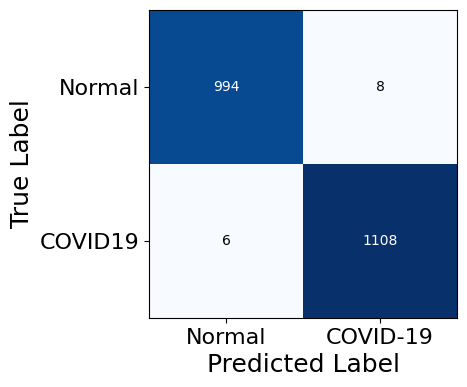

Accuracy of the model is 0.9934
Recall of the model is 0.9946
Precision of the model is 0.9928
F1 Score of the model is 0.9937


In [ ]:
test_dataset_dcgan = ConcatDataset([generated_dataset_dcgan_500img, test_data_covid_64, testdata_normal_1k])
test_loader_dcgan = DataLoader(test_dataset_dcgan, batch_size=batch_size)

model.to(device)
preds_dcgan, labels_dcgan = test_predict(model, test_loader_dcgan)
cm_dcgan = confusion_matrix(preds_dcgan, labels_dcgan)
plotting_confusion_matrix(cm_dcgan)
compute_performance_metrics(cm_dcgan, preds_dcgan, labels_dcgan)

### Using generated images from WGAN-GP

test_loss: 0.0181, test_acc: 0.9945


<Figure size 640x480 with 0 Axes>

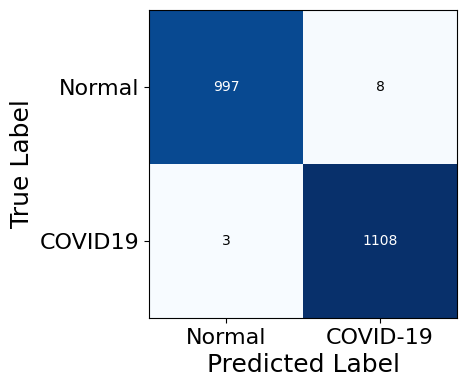

Accuracy of the model is 0.9948
Recall of the model is 0.9973
Precision of the model is 0.9928
F1 Score of the model is 0.9951


In [ ]:
test_dataset_w64 = ConcatDataset([generated_dataset_w64_500img, test_data_covid_64, testdata_normal_1k])
test_loader_w64 = DataLoader(test_dataset_w64, batch_size=batch_size)

model.to(device)
preds_w64, labels_w64 = test_predict(model, test_loader_w64)
cm_w64 = confusion_matrix(preds_w64, labels_w64)
plotting_confusion_matrix(cm_w64)
compute_performance_metrics(cm_w64, preds_w64, labels_w64)